## Create Training/Validation GT

### Create train-val split

In [9]:
# lets do a random split first and figure the rest out later...

In [96]:
from pathlib import Path
import random
import shutil

In [88]:
src_img_dir = "/home/csgrad/jayashok/data/chart_data_gv/saleem_annot/old_chart_data/images/"
src_annot_dir = "/home/csgrad/jayashok/data/chart_data_gv/saleem_annot/old_chart_data/annot_json/"

target_dir = "/data_local/jayashok/old_chart_data/"

In [77]:
GLOB_IMG = "*[.png|.PNG][.jpg|.JPG]"

In [78]:
img_path = {img_path.stem: img_path for img_path in Path(src_img_dir).glob(GLOB_IMG)}
annot_path = {annot_path.stem: annot_path for annot_path in Path(src_annot_dir).glob("*.json")}
sample_names = sorted(list(set(img_path.keys()).intersection(set(annot_path.keys()))))

In [79]:
len(sample_names)

31

In [85]:
def train_test_split(data, test_ratio):
    random.shuffle(data)
    split_index = int(len(data) * (1 - test_ratio))
    train_data = data[:split_index]
    test_data = data[split_index:]
    return train_data, test_data


train_samples, test_samples = train_test_split(sample_names, test_ratio=0.2)


In [86]:
len(train_samples), len(test_samples)

(24, 7)

In [89]:
Path(target_dir).mkdir(exist_ok=True)

In [95]:
train_img_dir = f"{target_dir}/train_images/" 
val_img_dir = f"{target_dir}/val_images/"
train_annot_dir = f"{target_dir}/train_json_pmc/" 
val_annot_dir = f"{target_dir}/val_json_pmc/"

Path(train_img_dir).mkdir(exist_ok=True)
Path(val_img_dir).mkdir(exist_ok=True)
Path(train_annot_dir).mkdir(exist_ok=True)
Path(val_annot_dir).mkdir(exist_ok=True)

In [97]:
for sample in train_samples:
    shutil.copy(f"{src_img_dir}/{sample}.jpg", f"{train_img_dir}/{sample}.jpg")
    shutil.copy(f"{src_annot_dir}/{sample}.json", f"{train_annot_dir}/{sample}.json")

for sample in test_samples:
    shutil.copy(f"{src_img_dir}/{sample}.jpg", f"{val_img_dir}/{sample}.jpg")
    shutil.copy(f"{src_annot_dir}/{sample}.json", f"{val_annot_dir}/{sample}.json")

In [102]:
!ls {val_img_dir} | wc -l

ls: cannot access '/data_local/jayashok/old_chart_data//val_images/#': No such file or directory
0


In [101]:
!ls {val_annot_dir} | wc -l

7


### Generate Instance Annotations from Scratch - PMC/AdobeSynth

In [1]:
from pathlib import Path
import mmcv
from tqdm import tqdm
import cv2

import subprocess
import json

import importlib

import pmc_line_loader
from pmc_line_loader import get_inst_masks_bin, get_legend_masks_bin
import clean_chart
from clean_chart import get_clean_input

from PIL import Image
import numpy as np

import pandas as pd

import pycocotools.mask as mask_util

import matplotlib.pyplot as plt

import importlib

import copy 

import itertools
from functools import partial
import multiprocessing
import multiprocessing.pool

GLOB_IMG = "*[.png|.PNG][.jpg|.JPG]"

/home/csgrad/jayashok/miniconda3/envs/mask2former/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/csgrad/jayashok/miniconda3/envs/mask2former/lib/python3.8/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


ModuleNotFoundError: No module named 'pmc_line_loader'

In [ ]:
def parse_line_data(annot):
    # mapping between visual elements to legend labels
    data_series = annot['task6']['output']['data series']
    visual_elements = annot['task6']['output']['visual elements']['lines']
    label2dataidx = {item['name']: idx for idx, item in enumerate(data_series)}
    label2visual_elem = {label:visual_elements[idx] for label,idx in label2dataidx.items()}

    # Check Legend Patches
    legend_patches = annot['task5']['output'].get('legend_pairs', [])
    if legend_patches:
        legend_ids = [item['id'] for item in legend_patches]
        text_blocks = annot['task2']['output']['text_blocks']
        legend_id2label = {item['id']: item['text'] for item in text_blocks if item['id'] in legend_ids}
        legend_id2txtbox = {item['id']: item['polygon'] for item in text_blocks if item['id'] in legend_ids}
        legend_id2bbox = {patch['id']: [patch['bb']['x0'], patch['bb']['y0'], patch['bb']['x0'] + patch['bb']['width']-1,
                                        patch['bb']['y0'] + patch['bb']['height']-1] for patch in legend_patches}

        lines_data = [{'id': id, 'legend_patch': legend_id2bbox[id],
                    'label_txtbox': legend_id2txtbox[id],
                    'label': legend_id2label[id],
                    'visual_elements': label2visual_elem[legend_id2label[id]]}
                    for id in legend_id2bbox if legend_id2label[id] in label2visual_elem]

    else:
        lines_data = [{'id': None, 'legend_patch': [],
                    'label_txtbox': [],
                    'label': label,
                    'visual_elements': ln_data} 
                    for label, ln_data in label2visual_elem.items()]

    return lines_data


def get_legend_area(patches, txt_boxes):
    txt_boxes = [
                  [min([poly['x0'], poly['x1'], poly['x2'], poly['x3']]),
                   min([poly['y0'], poly['y1'], poly['y2'], poly['y3']]),
                   max([poly['x0'], poly['x1'], poly['x2'], poly['x3']]),
                   max([poly['y0'], poly['y1'], poly['y2'], poly['y3']]),
                   ] for poly in txt_boxes]
    
    all_boxes = txt_boxes + patches
    all_boxes = np.array(all_boxes)
    return [all_boxes[:, 0].min(), all_boxes[:, 1].min(), all_boxes[:, 2].max(), all_boxes[:, 3].max()]


def transform_line_data(lines_data, transformation):
    lines_data = copy.deepcopy(lines_data)
    
    (sx, sy, tx_crop, ty_crop, tx_padd, ty_padd) = transformation

    def _transform_x(x):
        return int((x-tx_crop)*sx + tx_padd)

    def _transform_y(y):
        return int((y-ty_crop)*sy + ty_padd)
    
    
    for ln in lines_data:
        
        if ln['legend_patch']:
            # transform legend_patch coordinates
            x1,y1,x2,y2 = ln['legend_patch']
            x1 = _transform_x(x1); x2 = _transform_x(x2)
            y1 = _transform_y(y1); y2 = _transform_y(y2)
            ln['legend_patch'] = [x1,y1,x2,y2]

            
            # transform label_txtbox coordinates
            for xi in ['x0', 'x1', 'x2', 'x3']:
                ln['label_txtbox'][xi] = _transform_x(ln['label_txtbox'][xi])

            for yi in ['y0', 'y1', 'y2', 'y3']:
                ln['label_txtbox'][yi] = _transform_y(ln['label_txtbox'][yi])
        
        # transform line points
        for pt in ln['visual_elements']:
            pt['x'] = _transform_x(pt['x']); pt['y'] = _transform_y(pt['y'])
    
    return lines_data


def generate_mask_for_clean_img(clean_img, annot, transformation, thickness, include_legend):
    height, width = clean_img.shape[:2]
    
    lines_data = parse_line_data(annot)
    lines_data = transform_line_data(lines_data, transformation)

    # line_masks, final_lg_mask = [], None
    line_masks, lg_masks = [], []

    # get line only instance masks
    ln_data = [line['visual_elements'] for line in lines_data]
    line_masks = get_inst_masks_bin(height, width, ln_data, thickness)

    # add legend mask
    if include_legend and lines_data and lines_data[0]['legend_patch']:
        patches = [line['legend_patch'] for line in lines_data]
        txt_boxes = [line['label_txtbox'] for line in lines_data]
        legend_area = get_legend_area(patches, txt_boxes)
        
        # get background
        legend_region = clean_img[legend_area[1]: legend_area[3]+1, legend_area[0]: legend_area[2]+1]
        # show_img(legend_region)
        lgnd_bg_color = np.median(legend_region, axis=(0,1))

        lg_masks = get_legend_masks_bin(clean_img, patches, lgnd_bg_color, tolerance=10)

        # print('lg_masks:')
        # for idx, lm in enumerate(lg_masks):
            # show_img(lm, title=str(idx))

        # add legend mask to line_masks
        # for idx, l_mask in enumerate(line_masks):
            # line_masks[idx] = cv2.bitwise_or(l_mask,lg_masks[idx])

        # print('l_mask after bitwise or:')
        # for idx, lm in enumerate(line_masks):
            # show_img(lm, title=str(idx))

        # combine all legend instances into single mask
        # final_lg_mask = lg_masks[0]
        # show_img(final_lg_mask, title='final_lg_mask_before')
        # for mask in lg_masks[1:]:
            # final_lg_mask = cv2.bitwise_or(final_lg_mask, mask)
            # show_img(final_lg_mask, title=f'final_lg_mask_later')

    inst_masks = {
        'line': line_masks,
        # 'legend': final_lg_mask,
        'legend': lg_masks,
    }
    return inst_masks
    
    
def clean_n_get_mask(img_path, annot_path, save_img_path, line_thickness, include_legend=False):
    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)

    with open(annot_path, 'rb') as f:
        annot = json.load(f)
    try:
        clean_img, transformation = get_clean_input(img, annot, crop_to_plot=False, remove_text_legend=False, max_size=512, padd=True)
        h,w = clean_img.shape[:2]
        inst_masks = generate_mask_for_clean_img(clean_img, annot, transformation, line_thickness, include_legend)

        # save clean_image
        if save_img_path:
            mmcv.imwrite(clean_img, str(save_img_path))
    except:
        print(f'Error for: {img_path}')
        # return [], {}
        raise

    return inst_masks, dict(file_name=img_path.name.replace(".jpg", ".png"), height=h, width=w)


def generate_coco_inst_annot_worker(line_thickness, include_legend, sample):
    sample_idx, img_path, annot_path, save_img_path = sample

    inst_masks, img_info = clean_n_get_mask(img_path, annot_path, save_img_path, line_thickness, include_legend)
    img_info['id'] = sample_idx
    annot = []

    for m_idx, mask in enumerate(inst_masks['line']):
        segment_mask = mask > 0
        rle_mask = mask_util.encode(np.array(segment_mask[:, :, np.newaxis], order='F', dtype='uint8'))[0]
        rle_mask['counts'] = rle_mask['counts'].decode()
        annot.append({'image_id': img_info['id'], 'category_id': 1, 'iscrowd': 0,
                    "bbox": [1,2,3,4], "area": 10, # CAUTION: BBOX are not used, but these values (non-zero) are necessary for CocoDataset loader to work properly!!
                'segmentation': rle_mask})

    
    # add legend masks if they exist
    if inst_masks.get('legend'):
        for m_idx, mask in enumerate(inst_masks['legend']):
            segment_mask = mask > 0
            rle_mask = mask_util.encode(np.array(segment_mask[:, :, np.newaxis], order='F', dtype='uint8'))[0]
            rle_mask['counts'] = rle_mask['counts'].decode()
            annot.append({'image_id': img_info['id'], 'category_id': 2, 'iscrowd': 0,
                        "bbox": [1,2,3,4], "area": 10, # CAUTION: BBOX are not used, but these values (non-zero) are necessary for CocoDataset loader to work properly!!
                    'segmentation': rle_mask})

    return (img_info, annot)


def generate_coco_inst_annot(annot_dir, img_dir, target_img_dir, categories, line_thickness, include_legend):
    
    img_path = {img_path.stem: img_path for img_path in Path(img_dir).glob(GLOB_IMG)}
    annot_path = {annot_path.stem: annot_path for annot_path in Path(annot_dir).glob("*.json")}
    sample_names = sorted(list(set(img_path.keys()).intersection(set(annot_path.keys()))))

    process_func = partial(generate_coco_inst_annot_worker, line_thickness, include_legend)

    try:
        num_processes = multiprocessing.cpu_count()
        data_samples = zip(range(len(sample_names)),
         [img_path[sample] for sample in sample_names],
         [annot_path[sample] for sample in sample_names],
         [None if not target_img_dir else target_img_dir+f"/{sample}.png" for sample in sample_names])

        annotations = []
        images = []
        chunksize=64
        with multiprocessing.pool.Pool(processes=num_processes) as p:
            with tqdm(total=len(sample_names)) as pbar:
                for i, res in tqdm(enumerate(p.imap(process_func, data_samples, chunksize=chunksize))):
                    img_info, annot_info = res
                    images.append(img_info)
                    annotations.append(annot_info)
                    pbar.update(chunksize)

    # mmcv.dump(, out_json_file)
    except KeyboardInterrupt:
        pass

    # flatten annotations
    annotations = list(itertools.chain(*annotations))
    # update id for each annotation/instance
    for idx, annot in enumerate(annotations):
        annot['id'] = idx+1

    return dict(images=images, annotations=annotations, categories=categories)


In [2]:
sample_type = 'train'

# for adobe synth
# parent_dir = ""
# coco_dir = "coco"

#for pmc 
parent_dir = "pmc_data_2022/"
# coco_dir = "coco_pmc_unclean"
coco_dir = "coco_pmc_deg"

annot_dir = f"/data_local/jayashok/{parent_dir}/{sample_type}_json_pmc"
img_dir = f"/data_local/jayashok/{parent_dir}/{sample_type}_images"
target_img_dir = f"/data_local/jayashok/{coco_dir}/{sample_type}_images/"
coco_categories_file = f"/data_local/jayashok/panoptic_coco_categories.json"

In [5]:
!ls {img_dir}

PMC1090595___1471-2458-5-36-1.jpg
PMC1112601___1471-2458-5-40-1.jpg
PMC1164420___1471-2458-5-51-1.jpg
PMC1166547___1471-2156-6-26-4.jpg
PMC1166548___1471-2156-6-29-4.jpg
PMC1175092___1471-2458-5-55-8.jpg
PMC1177964___1471-2458-5-61-2.jpg
PMC1180456___1471-2458-5-64-3.jpg
PMC1183521___pgen.0010002.g005.jpg
PMC1185549___1471-2458-5-75-3.jpg
PMC1185549___1471-2458-5-75-4.jpg
PMC1190168___1471-2156-6-40-1.jpg
PMC1193525___pgen.0010015.g005.jpg
PMC1200427___pgen.0010032.g001.jpg
PMC1200427___pgen.0010032.g002.jpg
PMC1201368___pgen.0010033.g004.jpg
PMC1249584___1471-2458-5-98-5.jpg
PMC1262190___pgen.0010051.g002.jpg
PMC1262190___pgen.0010051.g004.jpg
PMC1310579___pgen.0010070.g001.jpg
PMC1343564___1471-2458-5-136-3.jpg
PMC1361804___1471-2458-5-130-4.jpg
PMC1402322___1471-2156-7-5-1.jpg
PMC1403762___1471-2458-6-16-1.jpg
PMC1403762___1471-2458-6-16-2.jpg
PMC1459128___1471-2458-6-69-2.jpg
PMC1712340___1471-2458-6-291-11.jpg
PMC1712340___1471-2458-6-291-2.jpg
PMC1781497___pgen.0030019.g004.jpg
P

In [ ]:
# Without Legend
# final_coco_annot_file = f"/data_local/jayashok/{coco_dir}/annotations/{sample_type}_coco_annot.json"

# With Legend
final_coco_annot_file = f"/data_local/jayashok/{coco_dir}/annotations/{sample_type}_coco_annot_w_legend_v2.json"
final_coco_annot_file

'/data_local/jayashok/coco_pmc_unclean/annotations/val_coco_annot_w_legend_v2.json'

In [ ]:
img_dir, annot_dir, target_img_dir

('/data_local/jayashok/pmc_data_2022//val_images',
 '/data_local/jayashok/pmc_data_2022//val_json_pmc',
 '/data_local/jayashok/coco_pmc_unclean/val_images/')

#### Optional - Save Clean Images

In [ ]:
for sample_path in Path(target_img_dir).glob("*.jpg"):
    img = mmcv.imread(str(sample_path))
    
    annot_path = annot_dir + f"/{sample_path.stem}.json"
    annot = mmcv.load(annot_path)

    save_img_path = target_img_dir + f"/{sample_path.stem}.png"
    clean_img, transformation = get_clean_input(img, annot, crop_to_plot=False, remove_text_legend=False, max_size=512, padd=True)
    # break
    # save clean_image
    mmcv.imwrite(clean_img, str(save_img_path))

In [ ]:
# !mkdir {target_img_dir}

#### Generate Coco annot data

In [ ]:
# Single Category => line
# categories = mmcv.load(coco_categories_file)

# Two Categories => line and legend
categories = [{'supercategory': 'foreground',
  'color': [220, 20, 60],
  'isthing': 1,
  'id': 1,
  'name': 'line'},
{'supercategory': 'foreground',
  'color': [20, 220, 60],
  'isthing': 1,
  'id': 2,
  'name': 'legend'}
]

##### Test Single Sample

In [ ]:
import random, os

In [ ]:
sample = random.choice(os.listdir(annot_dir)).rstrip(".json")
# sample = 'PMC3671151___1471-2458-13-484-2'
# sample = 'PMC4064264___1868-7083-6-11-2'


In [ ]:
sample

'PMC5513583___materials-02-02337-g004'

In [ ]:
test_inst_masks, test_img_info = clean_n_get_mask(img_path=Path(f"{img_dir}/{sample}.jpg"),
                                         annot_path=f"{annot_dir}/{sample}.json",
                                         save_img_path=None,
                                        line_thickness=3,
                                        include_legend=True)

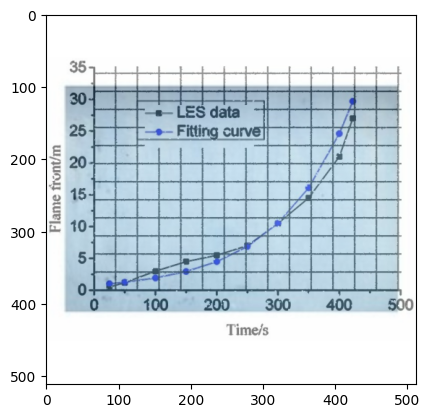

In [ ]:
show_img(mmcv.imread(f"{target_img_dir}/{sample}.png"))

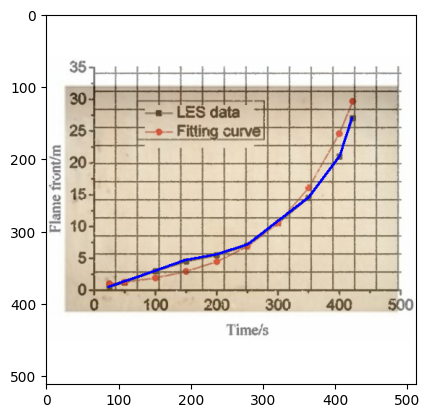

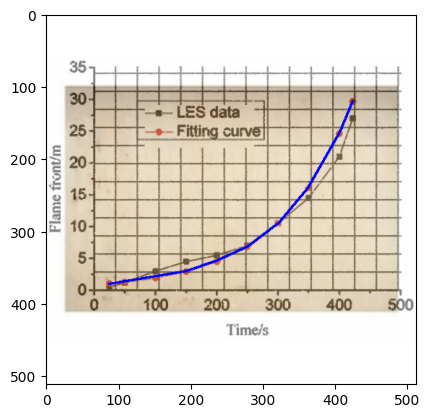

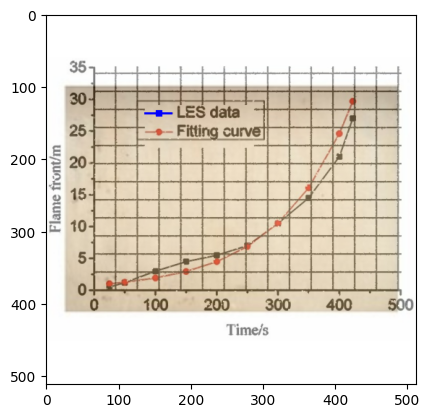

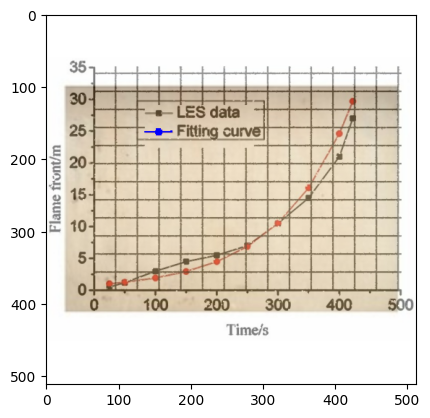

In [ ]:
# line
for idx in range(len(test_inst_masks['line'])):
    annot_img = mmcv.imread(f"{target_img_dir}/{sample}.png")
    # annot_img[lg_masks[idx]==1] = (255,0,0)
    annot_img[test_inst_masks['line'][idx]==1] = (255,0,0)
    show_img(annot_img, is_bgr=True)

# legend
for idx in range(len(test_inst_masks['line'])):
    annot_img = mmcv.imread(f"{target_img_dir}/{sample}.png")
    # annot_img[lg_masks[idx]==1] = (255,0,0)
    annot_img[test_inst_masks['legend'][idx]==1] = (255,0,0)
    show_img(annot_img, is_bgr=True)

In [ ]:
test_img_info

{'file_name': 'PMC5036694___ijerph-13-00861-g011.png',
 'height': 512,
 'width': 512}

##### Run on all samples

In [ ]:
coco_annot = generate_coco_inst_annot(annot_dir, img_dir,
                                    target_img_dir=None,
                                    categories=categories, line_thickness=3, include_legend=True)

86it [00:00, 98.68it/s][00:00<00:00, 73.32it/s]
5504it [00:00, 6274.00it/s]                    


In [ ]:
final_coco_annot_file

'/data_local/jayashok/coco_pmc_unclean/annotations/val_coco_annot_w_legend_v2.json'

In [ ]:
mmcv.dump(coco_annot, final_coco_annot_file)

### Add PMC - Chart Element Annotations to LineFormer

#### Main Functions

In [133]:
from pathlib import Path
import mmcv
from tqdm import tqdm
import cv2

import subprocess
import json

import importlib

# import pmc_line_loader
# from pmc_line_loader import get_inst_masks_bin, get_legend_masks_bin
import sys
sys.path.append("../utils/")
from clean_chart import get_clean_input

sys.path.append("/home/csgrad/jayashok/AIMLUtils/")
from vizutils import show_img

from PIL import Image
import numpy as np

import pandas as pd

import pycocotools.mask as mask_util

import matplotlib.pyplot as plt

import importlib

import copy 

import itertools
from functools import partial
import multiprocessing
import multiprocessing.pool

from collections import defaultdict

GLOB_IMG = "*[.png|.PNG][.jpg|.JPG]"

In [134]:
categories = [
{'supercategory': 'foreground',
  'color': [220, 20, 60],
  'isthing': 1,
  'id': 1,
  'name': 'line'},
 {'supercategory': 'foreground',
  'color': [20, 220, 60],
  'isthing': 1,
  'id': 2,
  'name': 'legend'},
{'supercategory': 'foreground', 
 'color': [30, 20, 100], 
 'isthing': 1, 'id': 3,
  'name': 'x_title'},
{'supercategory': 'foreground',
'color': [10, 110, 20],
'isthing': 1, 'id': 4, 'name': 'y_title'},
{'supercategory': 'foreground',
'color': [102, 210, 0],
'isthing': 1, 'id': 5, 'name': 'chart_title'},
{'supercategory': 'foreground',
'color': [223, 45, 102],
'isthing': 1, 'id': 6, 'name': 'legend_label'},
{'supercategory': 'foreground',
'color': [0, 220, 210],
'isthing': 1, 'id': 7, 'name': 'mark_label'},
{'supercategory': 'foreground',
'color': [50, 20, 108],
'isthing': 1, 'id': 8, 'name': 'xlabel'},
{'supercategory': 'foreground',
'color': [4, 200, 10],
'isthing': 1, 'id': 9, 'name': 'ylabel'},
{'supercategory': 'foreground',
'color': [100, 22, 10],
'isthing': 1, 'id': 10, 'name': 'x-axis'},
{'supercategory': 'foreground',
'color': [200, 220, 20],
'isthing': 1, 'id': 11, 'name': 'y-axis'},
]

cat2id = {cat['name']:cat['id'] for cat in categories}


In [135]:
def generate_axes_masks(image_width, image_height, plot_boxes, x_axis_boxes, y_axis_boxes, thickness):
    # Combine x-axis and y-axis boxes and types into single lists
    axis_boxes = x_axis_boxes + y_axis_boxes
    axis_types = ['x-axis'] * len(x_axis_boxes) + ['y-axis'] * len(y_axis_boxes)
    
    # Create a set of each axis-types to avoid duplicate axes in case of multi-plot charts
    axes_lines = {'x-axis': set(), 'y-axis': set()}

    for plot_box in plot_boxes:
        # how do you handle the case with multiple plot boxes
        for axis_box, axis_type in zip(axis_boxes, axis_types):

            px1, py1, px2, py2 = plot_box
            pw, ph = px2 - px1, py2 - py1
            ax1, ay1, ax2, ay2 = axis_box
            aw, ah = ax2 - ax1, ay2 - ay1

            plot_center_x = px1 + pw / 2
            plot_center_y = py1 + ph / 2
            axis_center_x = ax1 + aw / 2
            axis_center_y = ay1 + ah / 2

            if axis_type == 'x-axis':
                # If axis center is below the plot center, x-axis line is at the bottom of the plot-area bounding box
                if axis_center_y > plot_center_y:
                    axis_line = py2
                # Otherwise, it's at the top
                else:
                    axis_line = py1
                # print('x-axis:', axis_line)

            elif axis_type == 'y-axis':
                # If axis center is to the right of the plot center, y-axis line is at the right of the plot-area bounding box
                if axis_center_x > plot_center_x:
                    axis_line = px2
                # Otherwise, it's on the left
                else:
                    axis_line = px1
                
                # print('y-axis:', axis_line)
            
            axes_lines[axis_type].add(axis_line)

    x_masks = []
    for axis_line in axes_lines['x-axis']:        
        # Initialize an empty mask for this axis
        mask = np.zeros((image_height, image_width))
        # Create mask around this line based on thickness
        mask[max(0, axis_line - thickness):min(image_height, axis_line + thickness), px1:px2] = 1
        x_masks.append(mask)

    y_masks = []
    for axis_line in axes_lines['y-axis']:        
        # Initialize an empty mask for this axis
        mask = np.zeros((image_height, image_width))
        # Create mask around this line based on thickness
        mask[py1:py2, max(0, axis_line - thickness):min(image_width, axis_line + thickness)] = 1
        y_masks.append(mask)

    masks = {'x-axis': x_masks, 'y-axis': y_masks}

    return masks


In [136]:
def parse_coco_annot(coco_json_path):
    
    with open(coco_json_path, 'r') as f:
        coco_json = json.load(f)

    pmc_categories = pd.DataFrame(coco_json['categories'])
    pmc_images = pd.DataFrame(coco_json['images'])
    pmc_annot = pd.DataFrame(coco_json['annotations'])

    pmc_img_annot = pd.merge(left=pmc_images.rename(columns={'id':'image_id'}), right=pmc_annot, on = 'image_id')
    pmc_categories.drop(columns=['supercategory'], inplace=True, errors='ignore')
    pmc_img_annot = pd.merge(pmc_img_annot, pmc_categories.rename(columns={'id': 'category_id', 
                                                                         'name': 'category'}), on='category_id')

    pmc_img_annot = pmc_img_annot.drop(columns=['width', 'height', 'id', 'area', 'iscrowd', 'image_id', 'category_id'],errors='ignore').reset_index(drop=True)
    
    # drop image name suffix
    pmc_img_annot['file_name'] = pmc_img_annot['file_name'].apply(lambda x: Path(x).stem)
    
    return pmc_img_annot
    
def transform_box_data(bbox, transformation):
    (sx, sy, tx_crop, ty_crop, tx_padd, ty_padd) = transformation

    def _transform_x(x):
        return int((x-tx_crop)*sx + tx_padd)

    def _transform_y(y):
        return int((y-ty_crop)*sy + ty_padd)

    x1,y1,w,h = bbox
    x2,y2 = x1+w-1, y1+h-1
    
    return [_transform_x(x1),_transform_y(y1),_transform_x(x2),_transform_y(y2)]

def create_mask(height, width, bbox):
    canvas = np.zeros((height, width), np.uint8)
    x1, y1, x2, y2 = bbox
    # print(x1, y1, x2, y2)
    # print(canvas.shape)
    canvas[y1:y2+1, x1: x2+1] = 255
    # print('this is the returned mask')
    # plt.imshow(canvas)
    # plt.show()

    return canvas


def generate_mask_for_clean_img(height, width, elem_annot_df, transformation):
    inst_masks = defaultdict(list)

    for r_idx, r in elem_annot_df.iterrows():
        if r['category'] not in ('plot_area', 'x_axis_area', 'y_axis_area'):
            bbox = transform_box_data(r['bbox'], transformation)
            # create a mask based on bounding box
            inst_masks[r['category']].append(create_mask(height, width, bbox))

    x_axis_boxes = [transform_box_data(bbox, transformation) for bbox in elem_annot_df[elem_annot_df['category'] == 'x_axis_area']['bbox'].tolist()]
    y_axis_boxes = [transform_box_data(bbox, transformation) for bbox in elem_annot_df[elem_annot_df['category'] == 'y_axis_area']['bbox'].tolist()]
    plot_boxes = [transform_box_data(bbox, transformation) for bbox in elem_annot_df[elem_annot_df['category'] == 'plot_area']['bbox'].tolist()]

    # print(plot_boxes)
    # print(x_axis_boxes)
    # print(y_axis_boxes)
    axes_masks = generate_axes_masks(width, height, plot_boxes, x_axis_boxes, y_axis_boxes, thickness=3)
    inst_masks.update(axes_masks)
    
    return inst_masks

    
def clean_n_get_mask(elem_annot_df, img_path, annot_path, save_img_path):
    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)

    with open(annot_path, 'rb') as f:
        annot = json.load(f)
    try:
        clean_img, transformation = get_clean_input(img, annot, crop_to_plot=False, remove_text_legend=False, max_size=512, padd=True)
        h,w = clean_img.shape[:2]

        # print(len(elem_annot_df))
        # print(Path(img_path).stem)
        ann_df_for_sample = elem_annot_df.loc[elem_annot_df['file_name'] == Path(img_path).stem]
        # print(ann_df_for_sample)
        inst_masks = generate_mask_for_clean_img(h, w, ann_df_for_sample, transformation)

        # save clean_image
        if save_img_path:
            mmcv.imwrite(clean_img, str(save_img_path))
    except:
        print(f'Error for: {img_path}')
        # return [], {}
        raise

    return inst_masks, dict(file_name=img_path.name.replace(".jpg", ".png"), height=h, width=w)


# Update annoations for an image from instance masks
def add_annot(inst_masks, img_id):
    annot = []
    for cat, masks in inst_masks.items():
        # sepearte instance for every category annotation
        for mask in masks:
            segment_mask = mask > 0
            rle_mask = mask_util.encode(np.array(segment_mask[:, :, np.newaxis], order='F', dtype='uint8'))[0]
            rle_mask['counts'] = rle_mask['counts'].decode()
            annot.append({'image_id': img_id, 'category_id': cat2id[cat], 'iscrowd': 0,
                        "bbox": [1,2,3,4], "area": 10, # CAUTION: BBOX are not used, but these values (non-zero) are necessary for CocoDataset loader to work properly!!
                    'segmentation': rle_mask})
    
    return annot


def generate_coco_inst_annot_worker(prev_annot_img_id, elem_ann_df, sample):
    _, img_path, annot_path, save_img_path = sample
    
    inst_masks, img_info = clean_n_get_mask(elem_ann_df, img_path, annot_path, save_img_path)
    img_info['id'] = prev_annot_img_id[Path(img_path).stem]
    annot = add_annot(inst_masks, img_info['id'])

    return (img_info, annot)


def generate_coco_inst_annot(annot_dir, img_dir, target_img_dir, categories, element_coco_annot_path, prev_annot_img_id, annot_start=0):
    
    img_path = {img_path.stem: img_path for img_path in Path(img_dir).glob(GLOB_IMG)}
    annot_path = {annot_path.stem: annot_path for annot_path in Path(annot_dir).glob("*.json")}
    sample_names = sorted(list(set(img_path.keys()).intersection(set(annot_path.keys()))))
    
    elem_annot_df = parse_coco_annot(element_coco_annot_path)

    all_cat_list = pd.DataFrame(categories)['name'].values.tolist()
    # everything other than line and legend, are additional chart elements that we need to add..
    element_cat = [cat for cat in all_cat_list if cat not in ('line', 'legend')] + ['plot_area', 'x_axis_area', 'y_axis_area']
    elem_annot_df = elem_annot_df[elem_annot_df['category'].isin(element_cat)].reset_index(drop=True)
    
    process_func = partial(generate_coco_inst_annot_worker, prev_annot_img_id, elem_annot_df)

    try:
        num_processes = multiprocessing.cpu_count()
        data_samples = zip(range(len(sample_names)),
         [img_path[sample] for sample in sample_names],
         [annot_path[sample] for sample in sample_names],
         [None if not target_img_dir else target_img_dir+f"/{sample}.png" for sample in sample_names])

        annotations = []
        images = []
        chunksize=64
        with multiprocessing.pool.Pool(processes=num_processes) as p:
            with tqdm(total=len(sample_names)) as pbar:
                for i, res in tqdm(enumerate(p.imap(process_func, data_samples, chunksize=chunksize))):
                    img_info, annot_info = res
                    images.append(img_info)
                    annotations.append(annot_info)
                    pbar.update(chunksize)

    # mmcv.dump(, out_json_file)
    except KeyboardInterrupt:
        pass

    # flatten annotations
    annotations = list(itertools.chain(*annotations))
    # update id for each annotation/instance

    for idx, annot in enumerate(annotations, annot_start):
        annot['id'] = idx+1

    return dict(images=images, annotations=annotations, categories=categories)


In [182]:
sample_type = 'val'

# for adobe synth
# parent_dir = ""
# coco_dir = "coco"

#for pmc 
parent_dir = "pmc_data_2022/"
# coco_dir = "coco_pmc_unclean"
coco_dir = "coco_pmc_deg"

annot_dir = f"/data_local/jayashok/{parent_dir}/{sample_type}_json_pmc"
img_dir = f"/data_local/jayashok/{parent_dir}/{sample_type}_images"
# target_img_dir = f"/data_local/jayashok/{coco_dir}/{sample_type}_images/"
target_img_dir = None
# coco_categories_file = f"/data_local/jayashok/panoptic_coco_categories.json"

In [183]:
final_coco_annot_file = f"/data_local/jayashok/{coco_dir}/annotations/{sample_type}_coco_annot_w_chartelem_v2.json"
final_coco_annot_file

'/data_local/jayashok/coco_pmc_deg/annotations/val_coco_annot_w_chartelem_v2.json'

In [184]:
img_dir, annot_dir, target_img_dir

('/data_local/jayashok/pmc_data_2022//val_images',
 '/data_local/jayashok/pmc_data_2022//val_json_pmc',
 None)

In [185]:
element_annot_path = f"../elements_annot_pmc_coco/all.json"

In [186]:
with open(element_annot_path, 'r') as f:
    elem_coco_annot = json.load(f)

In [187]:
elem_coco_annot['categories']

[{'id': 1, 'name': 'x_title', 'supercategory': None},
 {'id': 2, 'name': 'y_title', 'supercategory': None},
 {'id': 3, 'name': 'plot_area', 'supercategory': None},
 {'id': 4, 'name': 'other', 'supercategory': None},
 {'id': 5, 'name': 'xlabel', 'supercategory': None},
 {'id': 6, 'name': 'ylabel', 'supercategory': None},
 {'id': 7, 'name': 'chart_title', 'supercategory': None},
 {'id': 8, 'name': 'x_tick', 'supercategory': None},
 {'id': 9, 'name': 'y_tick', 'supercategory': None},
 {'id': 10, 'name': 'legend_patch', 'supercategory': None},
 {'id': 11, 'name': 'legend_label', 'supercategory': None},
 {'id': 12, 'name': 'legend_title', 'supercategory': None},
 {'id': 13, 'name': 'legend_area', 'supercategory': None},
 {'id': 14, 'name': 'mark_label', 'supercategory': None},
 {'id': 15, 'name': 'value_label', 'supercategory': None},
 {'id': 16, 'name': 'y_axis_area', 'supercategory': None},
 {'id': 17, 'name': 'x_axis_area', 'supercategory': None},
 {'id': 18, 'name': 'tick_grouping', 'su

In [188]:
with open(f'/data_local/jayashok/{coco_dir}/annotations/{sample_type}_coco_annot_w_legend_v2.json', 'r') as f:
    old_annot = json.load(f)

In [189]:
prev_annot_img_id = dict(pd.DataFrame(old_annot['images'])[['file_name', 'id']].apply(lambda r: (Path(r['file_name']).stem, r['id']),  axis=1).values.tolist())

In [190]:
elem_annot_df = parse_coco_annot(element_annot_path)

#### Test Mask Conversion on sample images..

PMC5463025___gr7


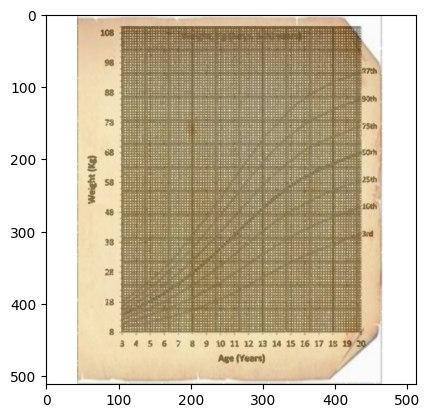

categoy: x_title


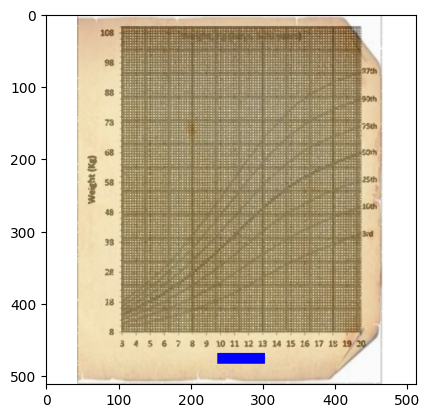

categoy: y_title


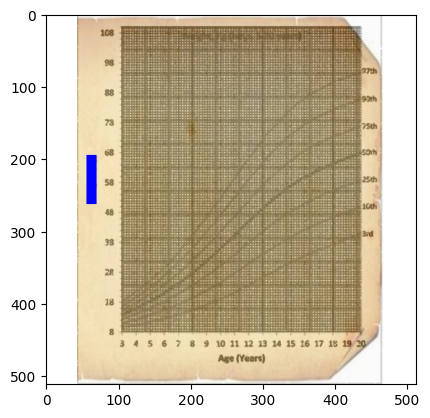

categoy: xlabel


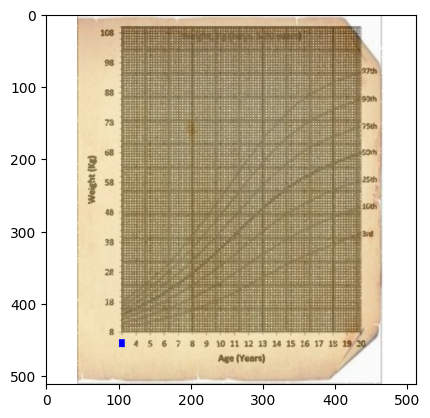

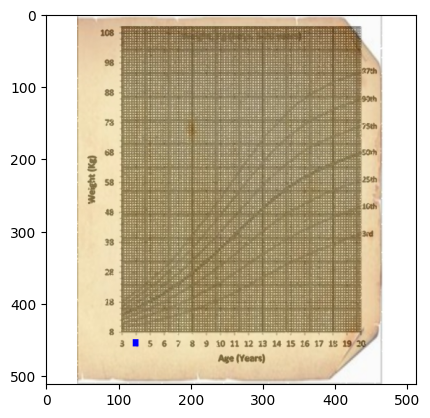

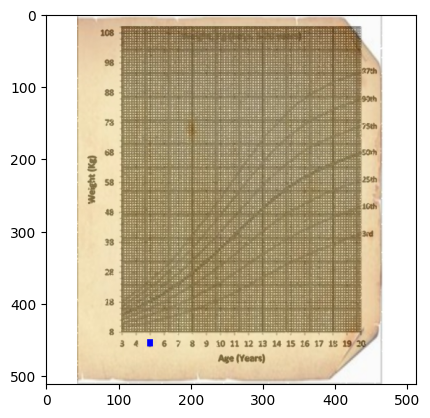

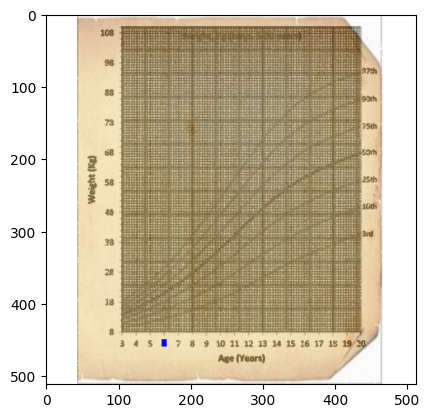

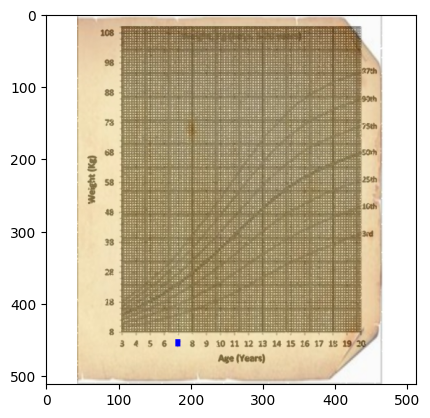

...

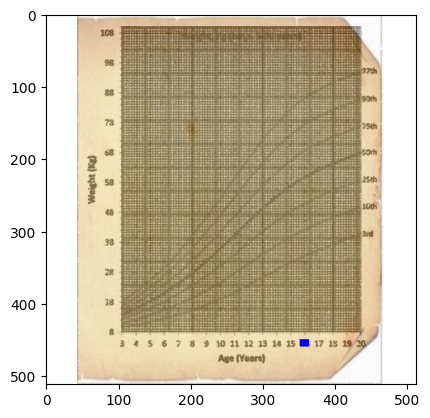

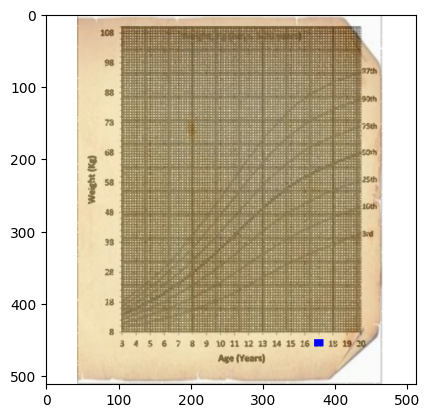

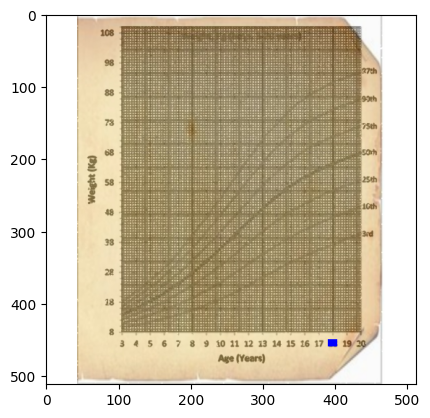

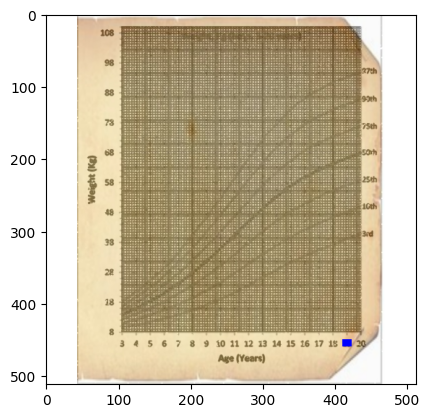

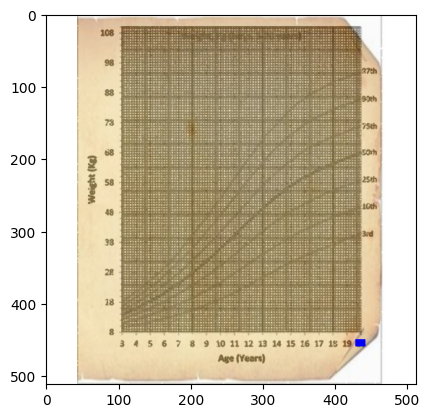

categoy: ylabel


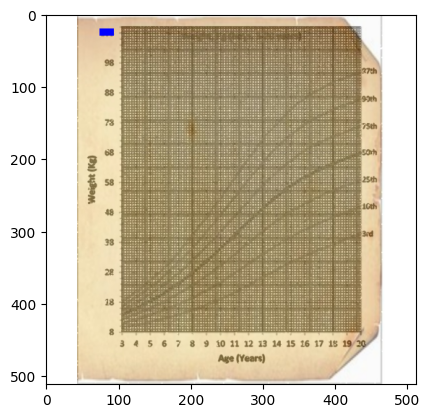

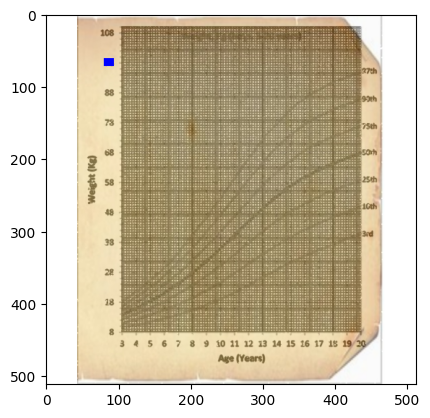

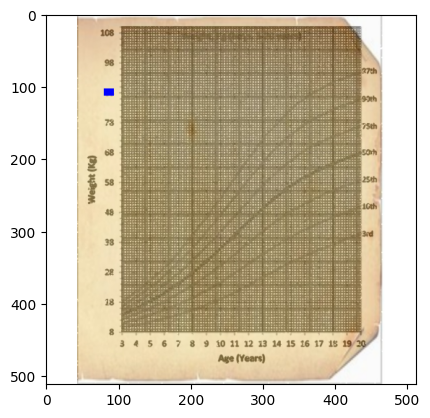

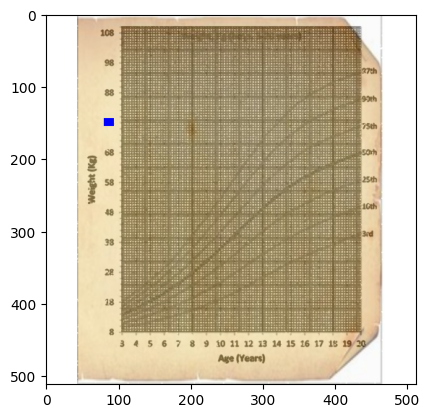

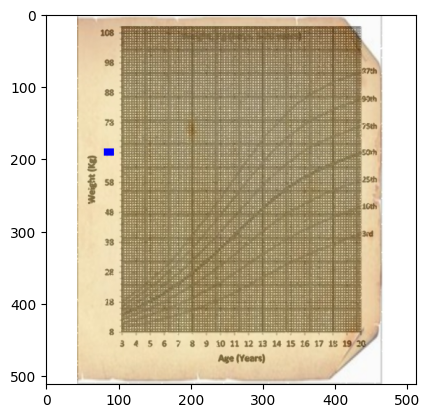

...

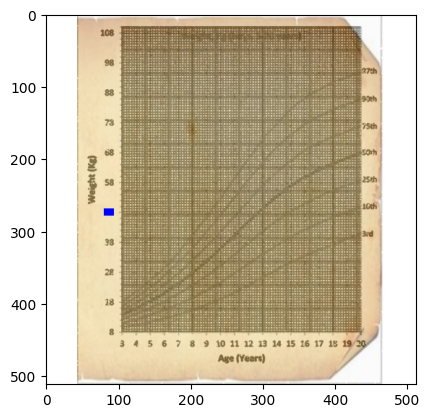

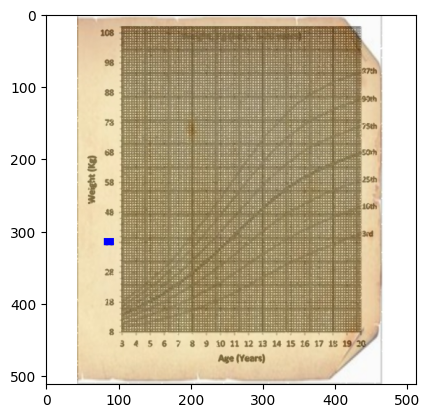

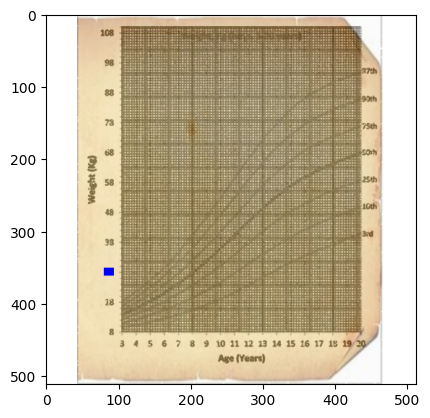

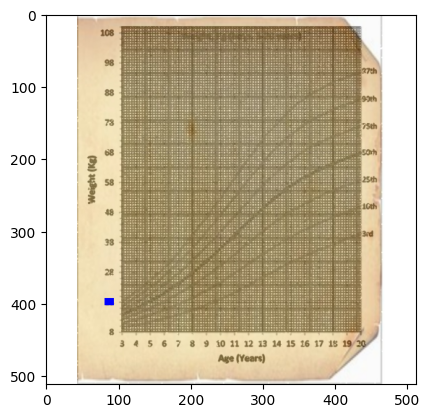

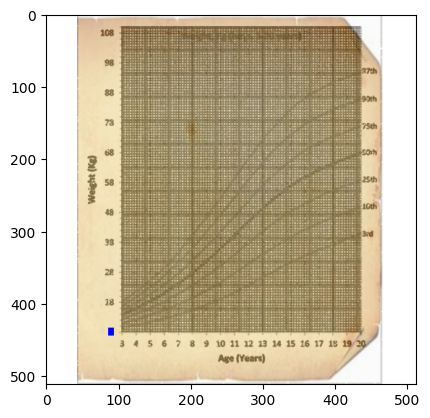

categoy: mark_label


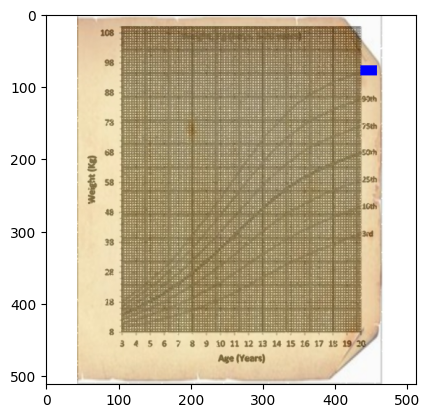

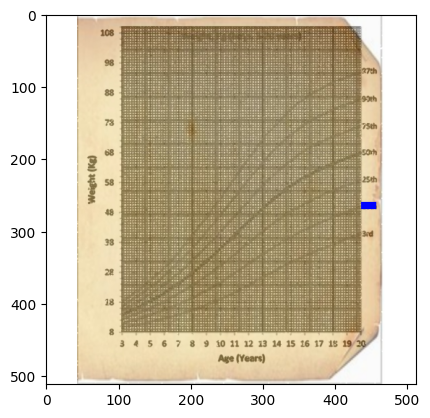

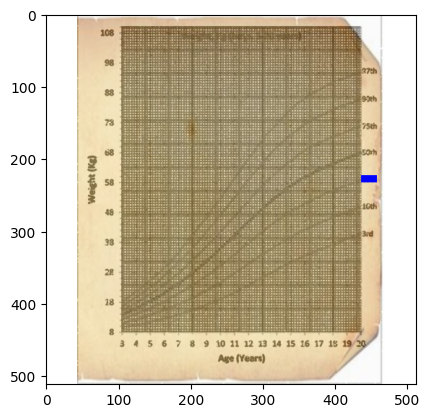

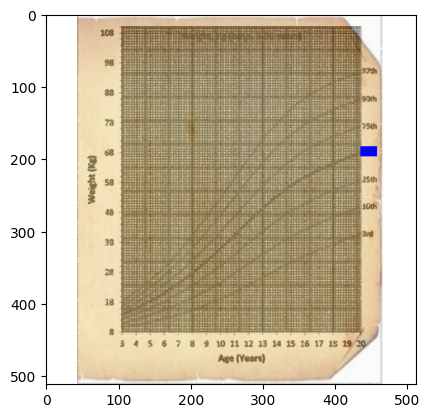

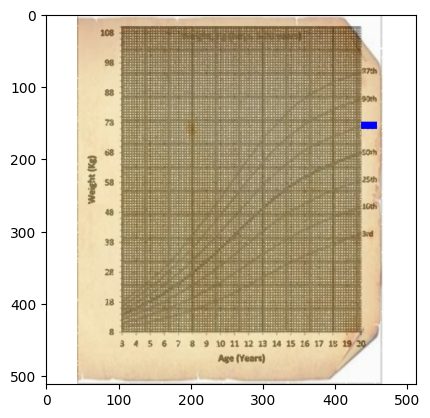

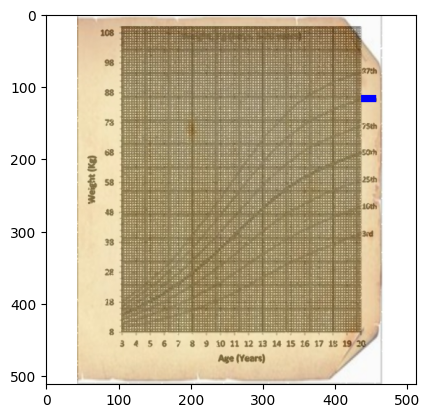

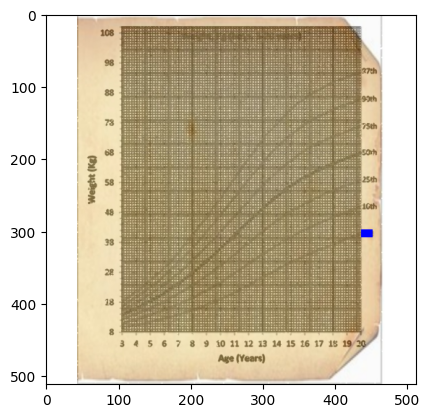

categoy: chart_title


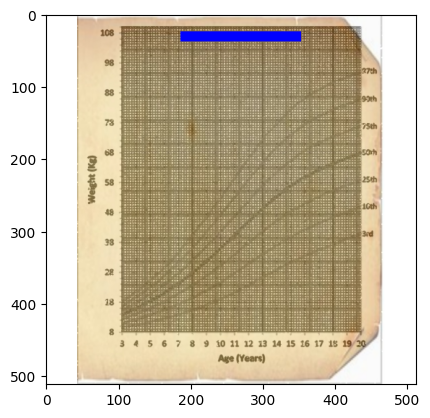

categoy: x-axis


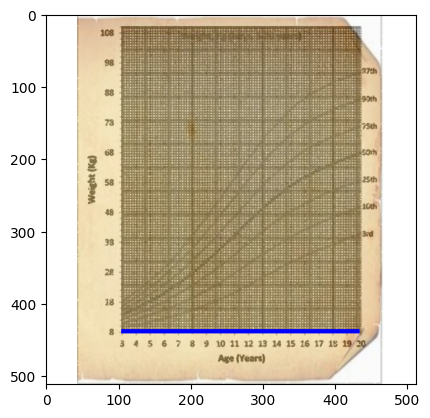

categoy: y-axis


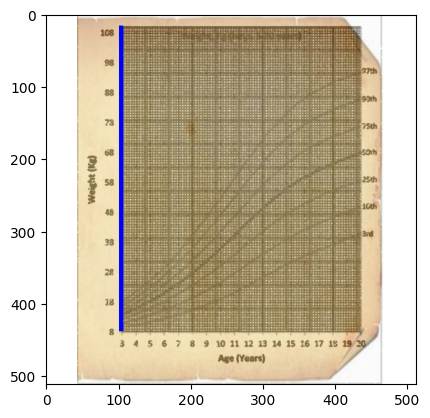

In [171]:
import random, os
sample = random.choice(os.listdir(annot_dir)).rstrip(".json")
# sample = 'PMC3671151___1471-2458-13-484-2' # Incorrect annotation for multiple y-axes
# sample = 'PMC4064264___1868-7083-6-11-2'
# sample = 'PMC4330922___fgene-06-00042-g0004'

print(sample)

elem_annot_df = parse_coco_annot(element_annot_path)

all_cat_list = pd.DataFrame(categories)['name'].values.tolist()
# everything other than line and legend, are additional chart elements that we need to add..
element_cat = [cat for cat in all_cat_list if cat not in ('line', 'legend')] + ['plot_area', 'x_axis_area', 'y_axis_area']

elem_annot_df = elem_annot_df[elem_annot_df['category'].isin(element_cat)].reset_index(drop=True)

test_inst_masks, test_img_info = clean_n_get_mask(elem_annot_df, img_path=Path(f"{img_dir}/{sample}.jpg"),
                                         annot_path=f"{annot_dir}/{sample}.json",
                                         save_img_path=None)

try_img_dir = f"/data_local/jayashok/{coco_dir}/{sample_type}_images/" 
show_img(cv2.imread(f"{try_img_dir}/{sample}.png"), is_bgr=True)

# # line
for cat, masks in test_inst_masks.items():
    print('categoy:', cat)
    # if 'axis' not in cat:
        # continue
    # print(len(masks))
    for mask in masks:
        annot_img = cv2.imread(f"{try_img_dir}/{sample}.png")
        # plt.imshow(mask)
        # plt.show()
        # show_img(mask)
        annot_img[mask>0] = (255,0,0)
        show_img(annot_img, is_bgr=True)

In [69]:
cat

^C


#### Run for all samples in batches

In [191]:
res = generate_coco_inst_annot(annot_dir, img_dir, target_img_dir,
                             categories,element_annot_path, prev_annot_img_id,
                              annot_start=old_annot['annotations'][-1]['id'])

86it [00:01, 51.11it/s][00:01<00:00, 33.24it/s]
5504it [00:01, 2851.99it/s]                    


In [192]:
res['images'] == old_annot['images']

True

In [193]:
res['categories'] == categories

True

In [194]:
old_annot['categories']

[{'supercategory': 'foreground',
  'color': [220, 20, 60],
  'isthing': 1,
  'id': 1,
  'name': 'line'},
 {'supercategory': 'foreground',
  'color': [20, 220, 60],
  'isthing': 1,
  'id': 2,
  'name': 'legend'}]

In [195]:
old_annot['annotations'].extend(res['annotations'])

In [196]:
categories

[{'supercategory': 'foreground',
  'color': [220, 20, 60],
  'isthing': 1,
  'id': 1,
  'name': 'line'},
 {'supercategory': 'foreground',
  'color': [20, 220, 60],
  'isthing': 1,
  'id': 2,
  'name': 'legend'},
 {'supercategory': 'foreground',
  'color': [30, 20, 100],
  'isthing': 1,
  'id': 3,
  'name': 'x_title'},
 {'supercategory': 'foreground',
  'color': [10, 110, 20],
  'isthing': 1,
  'id': 4,
  'name': 'y_title'},
 {'supercategory': 'foreground',
  'color': [102, 210, 0],
  'isthing': 1,
  'id': 5,
  'name': 'chart_title'},
 {'supercategory': 'foreground',
  'color': [223, 45, 102],
  'isthing': 1,
  'id': 6,
  'name': 'legend_label'},
 {'supercategory': 'foreground',
  'color': [0, 220, 210],
  'isthing': 1,
  'id': 7,
  'name': 'mark_label'},
 {'supercategory': 'foreground',
  'color': [50, 20, 108],
  'isthing': 1,
  'id': 8,
  'name': 'xlabel'},
 {'supercategory': 'foreground',
  'color': [4, 200, 10],
  'isthing': 1,
  'id': 9,
  'name': 'ylabel'},
 {'supercategory': 'fo

In [197]:
final_coco_annot_file

'/data_local/jayashok/coco_pmc_deg/annotations/val_coco_annot_w_chartelem_v2.json'

In [198]:
old_annot['categories'] = categories

In [199]:
with open(final_coco_annot_file, 'w') as f:
    json.dump(old_annot, f)

### Verify generated Annotations

In [104]:
final_coco_annot_file

'/data_local/jayashok/coco_pmc_unclean/annotations/train_coco_annot_w_chartelem_v2.json'

In [105]:
coco_annot = mmcv.load(final_coco_annot_file)

In [106]:
coco_annot

{'images': [{'file_name': 'PMC1090595___1471-2458-5-36-1.png',
   'height': 512,
   'width': 512,
   'id': 0},
  {'file_name': 'PMC1112601___1471-2458-5-40-1.png',
   'height': 512,
   'width': 512,
   'id': 1},
  {'file_name': 'PMC1164420___1471-2458-5-51-1.png',
   'height': 512,
   'width': 512,
   'id': 2},
  {'file_name': 'PMC1166547___1471-2156-6-26-4.png',
   'height': 512,
   'width': 512,
   'id': 3},
  {'file_name': 'PMC1166548___1471-2156-6-29-4.png',
   'height': 512,
   'width': 512,
   'id': 4},
  {'file_name': 'PMC1175092___1471-2458-5-55-8.png',
   'height': 512,
   'width': 512,
   'id': 5},
  {'file_name': 'PMC1177964___1471-2458-5-61-2.png',
   'height': 512,
   'width': 512,
   'id': 6},
  {'file_name': 'PMC1180456___1471-2458-5-64-3.png',
   'height': 512,
   'width': 512,
   'id': 7},
  {'file_name': 'PMC1183521___pgen.0010002.g005.png',
   'height': 512,
   'width': 512,
   'id': 8},
  {'file_name': 'PMC1185549___1471-2458-5-75-3.png',
   'height': 512,
   'width

In [107]:
coco_annot['annotations']

[{'image_id': 0,
  'category_id': 1,
  'iscrowd': 0,
  'bbox': [1, 2, 3, 4],
  'area': 10,
  'segmentation': {'size': [512, 512],
   'counts': 'WUm03m?2N2O01000O01000O01000O01000O01000O0100O0100O01000O01000O01000O01000O01000O01000O01N2N00O1000O1000000000O1000O1000000000O1000O10000000O1000O1000000000O1000O1000000000O1000O100000000000O1000O1000000000000000O1000O100000000000000000O1000O1000000000000000O1000O100000000000O1000O10000000O1000O10000000O1000O10000000O1000O10000000O1000O10000000O1000O1000000000000000000000O1000O10000000000000000000000000000000000000O1000O100000000000000000000000000000000000000001O01O0000000000000000000000000000000000000001O01O00000000000000000001O010O010O010O10O10O010O010O10O10O010O010O10O10O010O010O010O10O10O010O010O10O10O010O010O000O0010O00010O00010O00010O00010O00010O0001O01O00010O00010O00010O00010O00010O00010O00100OZYb1'},
  'id': 1},
 {'image_id': 0,
  'category_id': 1,
  'iscrowd': 0,
  'bbox': [1, 2, 3, 4],
  'area': 10,
  'segmentation': {'size': [512, 51

In [108]:
import random, os
sample = random.choice(os.listdir(annot_dir)).rstrip(".json")
sample

'PMC4014436___pgen.1004355.g001'

In [109]:
df = pd.DataFrame(coco_annot['images']).query(f"file_name == '{sample}.png'")
print(df)
df['id']

                              file_name  height  width   id
356  PMC4014436___pgen.1004355.g001.png     512    512  356


356    356
Name: id, dtype: int64

In [110]:
test_annot = list(filter(lambda annot_: annot_['image_id'] == df['id'].values[0], coco_annot['annotations']))

In [111]:
show_path = f"/data_local/jayashok/{coco_dir}/{sample_type}_images/" + "/" + sample + ".png"
# show_path = f"/data_local/jayashok/coco_pmc_deg/{sample_type}_images/" + "/" + coco_annot['images'][1]['file_name']
show_path

'/data_local/jayashok/coco_pmc_unclean/train_images//PMC4014436___pgen.1004355.g001.png'

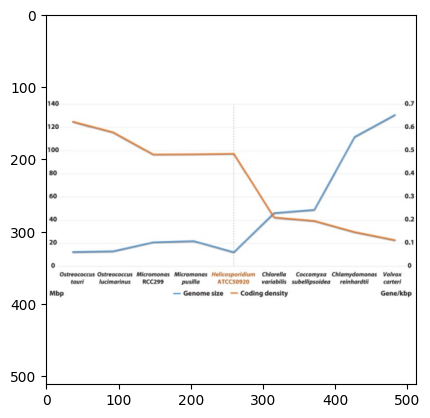

In [112]:
# plt.imshow(mmcv.imread("/data_local/jayashok/pmc_data_2022/val_images" + "/" + coco_annot['images'][4]['file_name'].replace(".png", ".jpg")))
show_img(mmcv.imread(show_path))

{'image_id': 356, 'category_id': 11, 'iscrowd': 0, 'bbox': [1, 2, 3, 4], 'area': 10, 'segmentation': {'size': [512, 512], 'counts': 'kS8P7P9000000000Uld7'}, 'id': 15342}


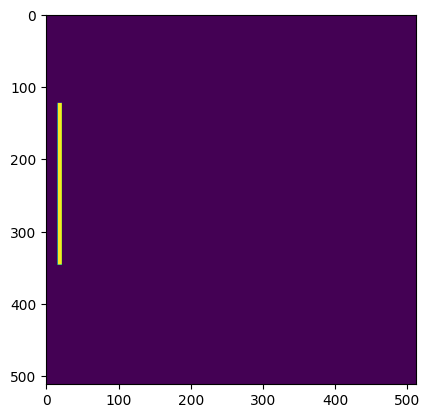

In [132]:
ann_idx = 24
# plt.imshow(mask_util.decode(test_annot[ann_idx]['segmentation']) | mask_util.decode(test_annot[ann_idx+1]['segmentation']))
print(test_annot[ann_idx])
plt.imshow(mask_util.decode(test_annot[ann_idx]['segmentation']))

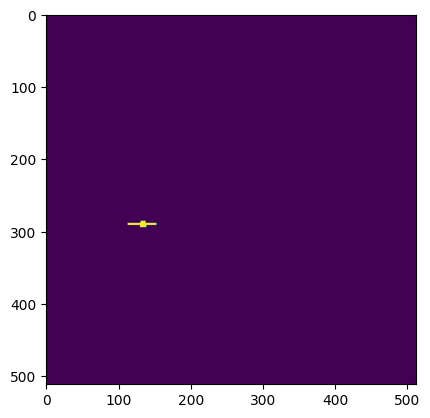

In [43]:
plt.imshow(mask_util.decode(coco_annot['annotations'][-22]['segmentation']))

In [130]:
print(coco_annot['categories'])

[{'supercategory': 'foreground', 'color': [220, 20, 60], 'isthing': 1, 'id': 1, 'name': 'line'}, {'supercategory': 'foreground', 'color': [20, 220, 60], 'isthing': 1, 'id': 2, 'name': 'legend'}]


In [131]:
print(coco_annot['annotations'][7])

{'image_id': 1, 'category_id': 1, 'iscrowd': 0, 'bbox': [1, 2, 3, 4], 'area': 10, 'segmentation': {'size': [512, 512], 'counts': 'Wmj13m?00000O1000O100000O1000O100000O1000O100000O1000O10000000O1000O100000O1000O100000O1000O100000O1000O100000RJOmK1R40nK0R40nK0R40nK0R40nK0R40nK0R40nK0R40nK0R40nK0R40nK0R40nK0R40nK0R40nK0R40mK1S4OmK1S4OmK0T40lK0T40lK0R:00000000000000000000000000000000000000000000000000000O1000O1000000000000000000000000000000000000000000000000000000000O1000O1000000000000000000000000000O100O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O010O0100O01000O01000O01000O0100O0100O01000O01000O01000O01000O01000O0100O0100O01000O01000O0100O001O01O0001O000001O0001O00000001O0001O00000001O0001O000001O0001O00000001O0001O000001O0001O01O1OfUc1'}, 'id': 8}


In [53]:
# Check Image to Mask Alignment!
test_img = mmcv.imread(show_path)
test_mask = mask_util.decode(coco_annot['annotations'][16]['segmentation'])

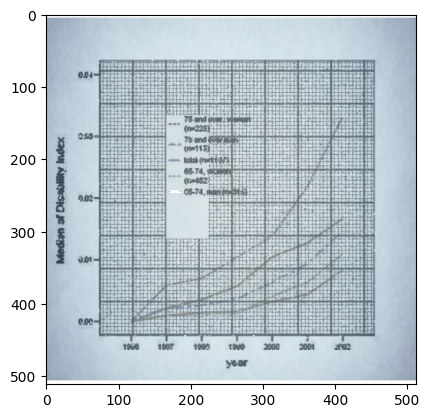

In [54]:
test_img[test_mask==1, :] = 255
show_img(test_img)

In [102]:
# plt.imshow(mmcv.imread("/data_local/jayashok/coco_pmc/val_images" + "/" + coco_annot['images'][4]['file_name']))

In [103]:
# plt.imshow(mask_util.decode(coco_annot['annotations'][20]['segmentation']))

In [135]:
!ls /data_local/jayashok/coco_pmc_deg/annotations

train_coco_annot.json		   val_coco_annot.json
train_coco_annot_w_legend_v1.json  val_coco_annot_w_legend_v1.json


### Generate Instance Annotaitons from Scratch - LineEX

In [45]:
from pathlib import Path
import mmcv
from tqdm import tqdm
import cv2

import subprocess
import json

import importlib

import pmc_line_loader
from pmc_line_loader import get_line_mask, get_inst_masks_bin
import clean_chart
from clean_chart import get_clean_input

from PIL import Image
import numpy as np

import pandas as pd

import pycocotools.mask as mask_util

import matplotlib.pyplot as plt

import importlib

import copy 
import random

import itertools
from functools import partial
import multiprocessing
import multiprocessing.pool

import line_utils

import sys
sys.path.append("/home/csgrad/jayashok/AIMLUtils/")
from vizutils import show_img
import fileutils

GLOB_IMG = "*[.png|.PNG][.jpg|.JPG]"


In [14]:
def map_coco_img_to_annot_list(coco_annot_json):
    # return a map from image_name to list of annotations for that corresponding image
    img_df = pd.DataFrame(coco_annot_json['images'])
    annot_df = pd.DataFrame(coco_annot_json['annotations'])
    mapped_annot = pd.merge(img_df[['id', 'file_name']], annot_df[['image_id', 'bbox']], how='inner', left_on='id', right_on='image_id')
    mapped_annot.drop(columns=['id'], inplace=True)
    mapped_annot.loc[:, 'file_name'] = mapped_annot['file_name'].apply(lambda x: Path(x).stem)
    img2annot = mapped_annot.groupby('file_name')['bbox'].agg(list).to_dict()
    # return mapped_annot.groupby('file_name')
    return img2annot


def parse_annot_LineEX(sample_annot):
    ground_kp = []
    ground_lines = []
    for anno in sample_annot:
        ground_kp.extend(anno)  
        ground_lines.append(anno)

    g_lines = []
    for line in ground_lines:
        g_x_cords = np.array(line[0::2]).astype(int)
        g_y_cords = np.array(line[1::2]).astype(int)
        temp = []
        for x,y in zip(g_x_cords,g_y_cords):
            temp.append((x,y))
        g_lines.append(temp)

    return g_lines

In [15]:
def generate_mask_for_clean_img(ln_data, transformation, height, width, thickness):
    if transformation:
        (sx, sy, tx_crop, ty_crop, tx_padd, ty_padd) = transformation
        ln_data = copy.deepcopy(ln_data)
        # print(sx, sy, tx_crop, ty_crop, tx_padd, ty_padd)
        for ln in ln_data:
            for pt in ln:
                pt['x'] = int((pt['x']-tx_crop)*sx + tx_padd)
                pt['y'] = int((pt['y']-ty_crop)*sy + ty_padd)
    
    inst_masks = get_inst_masks_bin(height, width, ln_data, thickness)
    return inst_masks
    
    
def clean_n_get_mask(img_path, annot, thickness, do_clean=True):
    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
    annot = parse_annot_LineEX(annot)
    try:
        if do_clean:
            clean_img, transformation = get_clean_input(img, annot, remove_text_legend=True, legend_margin=1, crop_margin=1, max_size=512, padd=True)
        else:
            # clean_img = cv2.resize(img, (), inte)
            clean_img = img
            transformation=None

        h,w = clean_img.shape[:2]
        ln_data = [line_utils.array_to_points(line) for line in annot]
        inst_masks = generate_mask_for_clean_img(ln_data, transformation, h, w, thickness)
    except:
        print(f'Error for: {img_path}')
        # return [], {}
        raise

    return inst_masks, dict(file_name=img_path.name.replace(".jpg", ".png"), height=h, width=w)


def generate_coco_inst_annot_worker(line_thickness, sample):
    sample_idx, img_path, annot = sample

    # Not worrying about saving clean images here...
    inst_masks, img_info = clean_n_get_mask(img_path, annot, line_thickness, do_clean=False)
    img_info['id'] = sample_idx
    annot = []
    for m_idx, mask in enumerate(inst_masks):
        segment_mask = mask > 0
        rle_mask = mask_util.encode(np.array(segment_mask[:, :, np.newaxis], order='F', dtype='uint8'))[0]
        rle_mask['counts'] = rle_mask['counts'].decode()
        annot.append({'image_id': img_info['id'], 'category_id': 1, 'iscrowd': 0,
                    "bbox": [1,2,3,4], "area": 10, # CAUTION: BBOX are not used, but these values (non-zero) are necessary for CocoDataset loader to work properly!!
                'segmentation': rle_mask})

    return (img_info, annot)


def generate_coco_inst_annot(annot_dir, img_dir, categories, max_samples, line_thickness):
    
    img_path = {img_path.stem: img_path for img_path in Path(img_dir).glob(GLOB_IMG)}
    
    # Single COCO annotation file...
    # annot_path = {annot_path.stem: annot_path for annot_path in Path(annot_dir).glob("*.json")}
    coco_line_annot = mmcv.load(annot_dir+"/line_anno.json")
    
    img_list = list(map(lambda fname: Path(fname).stem, pd.DataFrame(coco_line_annot['images'])['file_name'].values.tolist()))

    sample_names = list(set(img_path.keys()).intersection(set(img_list)))
    
    if max_samples:
        sample_names = random.sample(sample_names, max_samples)

    sample_names = sorted(sample_names)
    
    annot = map_coco_img_to_annot_list(coco_line_annot)
    process_func = partial(generate_coco_inst_annot_worker, line_thickness)

    try:
        num_processes = multiprocessing.cpu_count()

        # list of tuples => (img_path:str, annot:list of bbox)
        data_samples = zip(range(len(sample_names)), [img_path[sample] for sample in sample_names], [annot[sample] for sample in sample_names])

        annotations = []
        images = []
        chunksize=64
        # res = process_func(list(data_samples)[0])

        with multiprocessing.pool.Pool(processes=num_processes) as p:
            with tqdm(total=len(sample_names)) as pbar:
                for i, res in tqdm(enumerate(p.imap(process_func, data_samples, chunksize=chunksize))):
                    img_info, annot_info = res
                    images.append(img_info)
                    annotations.append(annot_info)
                    pbar.update(chunksize)

    # mmcv.dump(, out_json_file)
    except KeyboardInterrupt:
        pass

    # flatten annotations
    annotations = list(itertools.chain(*annotations))
    # update id for each annotation/instance
    for idx, annot in enumerate(annotations):
        annot['id'] = idx+1

    return dict(images=images, annotations=annotations, categories=categories)


In [16]:
sample_type = 'train'

# for adobe synth
# parent_dir = ""
# coco_dir = "coco"

#for pmc 
parent_dir = "other_datasets/LinEX/data"

# Path for saving the processed data...
coco_dir = "coco_LineEX"

annot_dir = f"/data_local/jayashok/{parent_dir}/{sample_type}/anno/"
img_dir = f"/data_local/jayashok/{parent_dir}/{sample_type}/images/"
coco_categories_file = f"/data_local/jayashok/panoptic_coco_categories.json"

In [17]:
full_save_dir_path = f"/data_local/jayashok/{coco_dir}/"
(Path(full_save_dir_path)/"annotations").mkdir(parents=True, exist_ok=True)
(Path(full_save_dir_path)/f"{sample_type}_images").mkdir(parents=True, exist_ok=True)

In [38]:
final_coco_annot_file = f"/data_local/jayashok/{coco_dir}/annotations/{sample_type}_coco_annot.json"
img_save_dir = f"/data_local/jayashok/{coco_dir}/{sample_type}_images/"
final_coco_annot_file, img_save_dir

('/data_local/jayashok/coco_LineEX/annotations/train_coco_annot.json',
 '/data_local/jayashok/coco_LineEX/train_images/')

In [61]:
coco_annot = generate_coco_inst_annot(annot_dir, img_dir, categories=mmcv.load(coco_categories_file), max_samples=40000, line_thickness=3)

40000it [00:49, 803.75it/s] t/s]                       
2560000it [00:49, 51404.78it/s] 


In [28]:
# !ls -l /data_local/jayashok/other_datasets/LinEX/data/val/images | wc -l

In [14]:
# TODO:
# create a method for loading LineEX data and getting gt series in PMC Visual elements format...

In [19]:
coco_annot = mmcv.load(final_coco_annot_file)

In [20]:
coco_annot.keys()

dict_keys(['images', 'annotations', 'categories'])

In [44]:
len(coco_annot['images']), len(coco_annot['annotations'])

(40000, 160169)

In [97]:
# coco_annot = {'annotations': coco_annot[1], 'images': [coco_annot[0]]}

In [67]:
mmcv.dump(coco_annot, final_coco_annot_file)

In [48]:
!ls -l {img_save_dir} | wc -l

40001


In [46]:
fileutils.copy_all(filenames=pd.DataFrame(coco_annot['images'])['file_name'].values.tolist(),
                    src_dir=img_dir, dst_dir=img_save_dir)

!ls -l {img_save_dir} | wc -l

#### Verify Annotations

In [68]:
coco_annot['annotations'][4]

{'image_id': 0,
 'category_id': 1,
 'iscrowd': 0,
 'bbox': [1, 2, 3, 4],
 'area': 10,
 'segmentation': {'size': [700, 1100],
  'counts': 'fao23he0100O010O010O010O010O010O010O0010O0010O010O010O010O010O010O010O0010O0010O010O010O010O010O010O0010O0010O010O010O010O010O010O010O0010O0010O010O010O010O010O010O0010O0010O010O010O010O010O010O010O0010O0010O010O010O010O010O010O0010O0010O010O010O010O010O010O010O0010O0010O010O010O010O010O010O0010O0010O010O010O010O010O010O010O0010O0010O010O010O010O010O010O0010O0010O010O010O010O010O010O010O0010O0010O010O010O010O010O010O0010O0010O010O010O010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O010O0010O0010O010O010O010O010O0010O001

In [79]:
# show_path = f"/data_local/jayashok/{coco_dir}/{sample_type}_images/" + "/" + coco_annot['images'][1]['file_name']
show_path = img_dir + coco_annot['images'][1]['file_name']
show_path

'/data_local/jayashok/other_datasets/LinEX/data/train/images/100014.png'

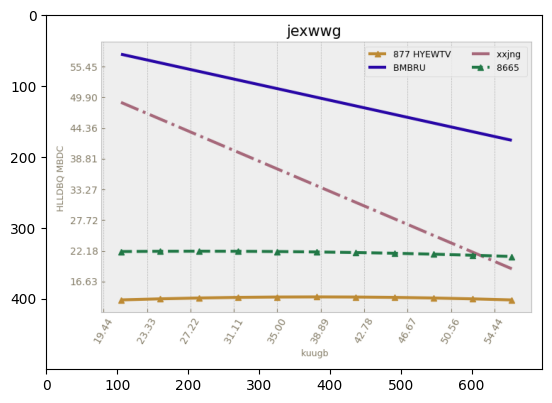

In [80]:
# plt.imshow(mmcv.imread("/data_local/jayashok/pmc_data_2022/val_images" + "/" + coco_annot['images'][4]['file_name'].replace(".png", ".jpg")))
plt.imshow(mmcv.imread(show_path))

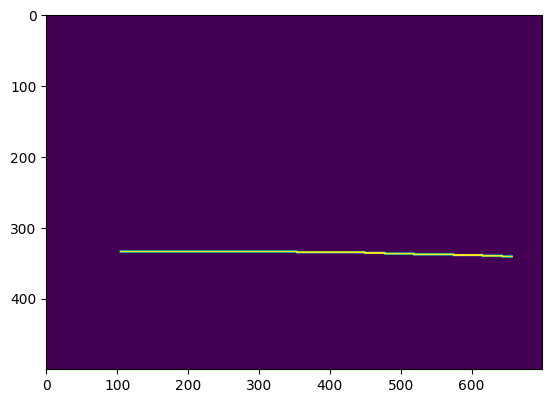

In [83]:
plt.imshow(mask_util.decode(coco_annot['annotations'][9]['segmentation']))

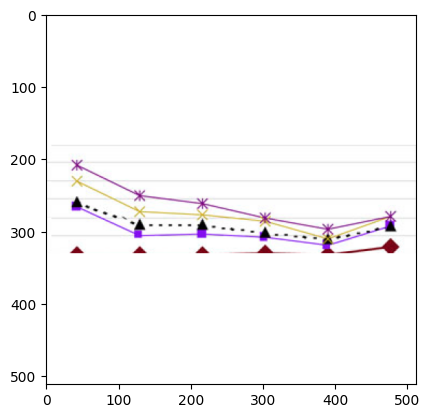

In [ ]:
plt.imshow(mmcv.imread("/data_local/jayashok/coco_pmc/val_images" + "/" + coco_annot['images'][4]['file_name']))

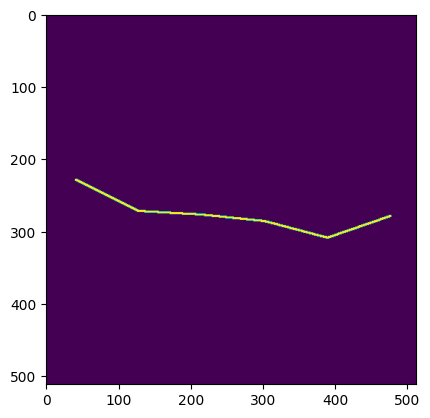

In [ ]:
plt.imshow(mask_util.decode(coco_annot['annotations'][20]['segmentation']))

In [ ]:
import os, random
import json
from PIL import Image
import mmcv
import random
import sys
sys.path.append("/home/csgrad/jayashok/AIMLUtils/")

import fileutils

In [ ]:
annot_dir = "/home/csgrad/jayashok/data/chart_data_gv/saleem_annot/old_chart_data/annot_json/"
img_dir = "/home/csgrad/jayashok/data/chart_data_gv/saleem_annot/old_chart_data/images/"

In [ ]:
!rm -rf {img_dir}

In [ ]:
# target_img_dir = "/data_local/ICPR2022_CHARTINFO_UB_PMC_TRAIN_v1.0/images/line/"
# target_annot_dir = "/data_local/ICPR2022_CHARTINFO_UB_PMC_TRAIN_v1.0/annotations_JSON/line/"

target_img_dir = "/data/chart_data_gv/saleem_annot"
target_annot_dir = "/data_local/ICPR2022_CHARTINFO_UB_PMC_TRAIN_v1.0/annotations_JSON/line/"

In [ ]:
json_samples = set(list(map(lambda x: x.stem, Path(target_annot_dir).glob("*"))))
img_samples = set(list(map(lambda x: x.stem, Path(target_img_dir).glob("*"))))

In [ ]:
!ls /data_local/jayashok/coco/train_images -l | wc -l

38036


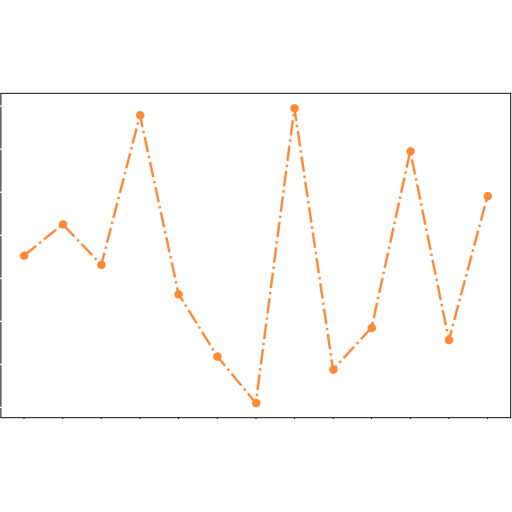

In [ ]:
Image.open("/data_local/jayashok/coco/train_images/"+ random.choice(os.listdir("/data_local/jayashok/coco/train_images/")))

In [ ]:
adb_syn_json = mmcv.load("/data_local/jayashok/coco/annotations/train_coco_annot.json")

In [ ]:
len(adb_syn_json['images'])

38035

In [ ]:
def get_task6_samples(annot_dir):
    samples = []
    # annot_dir = "/home/csgrad/jayashok/Chart_Infographic/datasets/AdobeSynth/train_gt/"
    # annot_dir = "/home/csgrad/jayashok/Chart_Infographic/datasets/AdobeSynth/test_release/task6/gt_json"
    for fpath in Path(annot_dir).glob("*.json"):
        with open(str(fpath), 'r') as f:
            annot = json.load(f)
        try:
            # print(annot)
            task6_data = True if (annot.get('task6') and annot['task6'].get('output')) else False
            if task6_data:
                samples.append(fpath.stem)
        except KeyboardInterrupt as ke:
            return
        except:
            print('Error for: ', fpath.stem)
            raise
    
    return samples

samples = get_task6_samples(annot_dir)
# with open('adobe_synth__samples.pkl', 'wb') as f:
#     pickle.dump(samples, f)

In [ ]:
len(samples)

1486

In [ ]:
test_samples = random.sample(samples, 86)

In [ ]:
train_samples = [sample for sample in samples if sample not in set(test_samples)]

In [ ]:
len(train_samples), len(test_samples), len(train_samples) + len(test_samples)

(1400, 86, 1486)

In [ ]:
!ls /data_local/jayashok/coco

annotations  test_images  train_images


In [ ]:
!mkdir /data_local/jayashok/coco_pmc/
!mkdir /data_local/jayashok/coco_pmc/annotations
!mkdir /data_local/jayashok/coco_pmc/test_images
!mkdir /data_local/jayashok/coco_pmc/train_images

!mkdir "/data_local/jayashok/pmc_data_2022/train_annot/"
!mkdir "/data_local/jayashok/pmc_data_2022/train_images/"
!mkdir "/data_local/jayashok/pmc_data_2022/val_images/"
!mkdir "/data_local/jayashok/pmc_data_2022/val_annot/"

mkdir: cannot create directory ‘/data_local/jayashok/coco_pmc/’: File exists
mkdir: cannot create directory ‘/data_local/jayashok/coco_pmc/annotations’: File exists
mkdir: cannot create directory ‘/data_local/jayashok/coco_pmc/test_images’: File exists
mkdir: cannot create directory ‘/data_local/jayashok/coco_pmc/train_images’: File exists


In [ ]:
!ls /data_local/jayashok/

clean_images	  panoptic_coco_categories.json  test_masks_2ch
coco		  pretrained_ckpt		 train_coco_images.json
coco_pmc	  test_coco_images.json		 train_images
exp_1_39500Iters  test_images			 train_json_pmc
experiments	  test_json_pmc			 train_masks_2ch


In [ ]:
!mkdir /data_local/jayashok/pmc_data_2022/

In [ ]:
!mkdir "/data_local/jayashok/pmc_data_2022/train_annot/"

In [ ]:

img_samples = set(list(map(lambda x: x.stem, Path(target_img_dir).glob("*"))))

In [ ]:
fileutils.copy_all(list(map(lambda x: x+".jpg", train_samples)), src_dir=target_img_dir, dst_dir="/data_local/jayashok/pmc_data_2022/train_images/")
fileutils.copy_all(list(map(lambda x: x+".json", train_samples)), src_dir=target_annot_dir, dst_dir="/data_local/jayashok/pmc_data_2022/train_json_pmc/")

fileutils.copy_all(list(map(lambda x: x+".jpg", test_samples)), src_dir=target_img_dir, dst_dir="/data_local/jayashok/pmc_data_2022/val_images/")
fileutils.copy_all(list(map(lambda x: x+".json", test_samples)),src_dir=target_annot_dir, dst_dir="/data_local/jayashok/pmc_data_2022/val_json_pmc/")

In [ ]:
len(list(Path("/data_local/jayashok/pmc_data_2022/train_annot/").glob("*")))

1400

In [ ]:
import json
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
import pickle

import pmc_line_loader
from pmc_line_loader import get_line_mask
import importlib

In [ ]:
import sys
sys.path.append("/home/csgrad/jayashok/AIMLUtils/")

In [ ]:
with open('adobe_synth_line_samples.pkl', 'rb') as f:
    samples = pickle.load(f)

In [ ]:
def get_line_samples():
    samples = []
    # annot_dir = "/home/csgrad/jayashok/Chart_Infographic/datasets/AdobeSynth/train_gt/"
    annot_dir = "/home/csgrad/jayashok/Chart_Infographic/datasets/AdobeSynth/test_release/task6/gt_json"
    for fpath in Path(annot_dir).glob("*.json"):
        with open(str(fpath), 'r') as f:
            annot = json.load(f)
        try:
            chart_type = annot['task1']['output']['chart_type']
            if chart_type.strip().lower() == 'line':
                samples.append(fpath.stem)
        except KeyboardInterrupt as ke:
            return
        except:
            print('Error for: ', fpath.stem)
            pass
    
    return samples

samples = get_line_samples()
# with open('adobe_synth__samples.pkl', 'wb') as f:
#     pickle.dump(samples, f)

In [ ]:
len(samples)

200

In [ ]:
# 200 Samples in test.. (should be enough!)

In [ ]:
with open('adobesynth_test_samples.pkl', 'wb') as f:
    pickle.dump(samples, f)

In [ ]:
# sample = "PMC5525355___12889_2017_4603_Fig1_HTML"
# sample = "169423"
sample = samples[1]
print(sample)

188599


In [ ]:
# annot_path = "../Chart_Infographic/datasets/ICPR2020_CHARTINFO_UB_PMC_TRAIN_v1.21/annotations_JSON/line/"+sample+".json"
annot_path = f"/home/csgrad/jayashok/Chart_Infographic/datasets/AdobeSynth/train_gt/{sample}.json"
img_path = f"/home/csgrad/jayashok/Chart_Infographic/datasets/AdobeSynth/images/{sample}.png"
# img_path = "../Chart_Infographic/datasets/ICPR2020_CHARTINFO_UB_PMC_TRAIN_v1.21/images/line/"+sample+".jpg"

### Move Line Samples to current data directory

In [ ]:
# adobe_synth_dir = "/home/csgrad/jayashok/Chart_Infographic/datasets/AdobeSynth/"
# adobe_synth_images = adobe_synth_dir + "images/"
# adobe_synth_annot =  adobe_synth_dir + "train_gt/"

adobe_synth_dir = "/home/csgrad/jayashok/Chart_Infographic/datasets/AdobeSynth/test_release/task6/"
adobe_synth_images = adobe_synth_dir + "png/"
adobe_synth_annot =  adobe_synth_dir + "gt_json/"

In [ ]:
# target_base_dir = "/home/csgrad/jayashok/Mask2Former/line_data/"
# target_img_dir = target_base_dir + "images/"
# target_annot_dir = target_base_dir + "json_pmc/"

target_base_dir = "/home/csgrad/jayashok/Mask2Former/line_data/"
target_img_dir = target_base_dir + "test_images/"
target_annot_dir = target_base_dir + "test_json_pmc/"

In [ ]:
import fileutils

In [ ]:
# with open('adobe_synth_line_samples.pkl', 'rb') as f:
#     samples = pickle.load(f)

In [ ]:
with open('adobe_synth_line_samples_test.pkl', 'rb') as f:
    samples = pickle.load(f)

In [ ]:
json_samples = set(list(map(lambda x: x.stem, Path(target_annot_dir).glob("*"))))
img_samples = set(list(map(lambda x: x.stem, Path(target_img_dir).glob("*"))))

In [ ]:
len(json_samples), len(img_samples)

(200, 200)

In [ ]:
# !mkdir {target_annot_dir}
# !mkdir {target_img_dir}

In [ ]:
# fileutils.copy_all([sample+".json" for sample in samples], adobe_synth_annot, target_annot_dir)

In [ ]:
# fileutils.copy_all([sample+".png" for sample in samples], adobe_synth_images, target_img_dir)

### Match the pmc-coco annotations with ones we already have

In [ ]:
import json
import cv2
import numpy as np
from PIL import Image
from pathlib import Path

import sys
sys.path.append("/home/csgrad/jayashok/AIMLUtils/")
from vizutils import show_img

In [ ]:
import pandas as pd

In [ ]:
train_pmc_files = set(map(lambda path: path.stem, list(Path("/data_local/jayashok/coco_pmc_unclean/train_images").glob("*"))))

In [ ]:
with open("../elements_annot_pmc_coco/train.json", "r") as f: train_coco_json = json.load(f)

In [ ]:
train_coco_files = set(map(lambda path: Path(path).stem, pd.DataFrame(train_coco_json['images'])['file_name'].values))

In [ ]:
len(train_pmc_files), len(train_coco_files)

(1400, 5052)

In [ ]:
# keep only the coco annotations that have overlaps with normal lneformer coco

In [ ]:
len(train_coco_files.intersection(train_pmc_files))

1252

In [ ]:
missing_chart_element_annot = []
for file in train_pmc_files:
    if file not in train_coco_files:
        missing_chart_element_annot.append(file)

In [ ]:
# could they be in val

In [ ]:
val

In [ ]:
len(missing_chart_element_annot)

148

In [ ]:
with open("../elements_annot_pmc_coco/val.json", "r") as f: val_coco_json = json.load(f)
val_coco_files = set(map(lambda path: Path(path).stem, pd.DataFrame(val_coco_json['images'])['file_name'].values))

In [ ]:
# move from val_coco to train-coco

In [ ]:
len(val_coco_files.intersection(set(missing_chart_element_annot))) == len(missing_chart_element_annot)

True

In [ ]:
# merge these annotations

In [ ]:
import json

def merge_pmc_coco_files(file1_path, file2_path, save_file_name):
    with open(file1_path, 'r') as f:
        data1 = json.load(f)
        
    with open(file2_path, 'r') as f:
        data2 = json.load(f)

    id_map = {}
    merged_images = []
    for img in data1.get('images', []):
        merged_images.append(img)
        id_map[img['id']] = img['id']

    for img in data2.get('images', []):
        if img['id'] in id_map:
            new_id = max(id_map.values()) + 1
            id_map[img['id']] = new_id
            img['id'] = new_id
        else:
            id_map[img['id']] = img['id']
        merged_images.append(img)

    for ann in data2.get('annotations', []):
        ann['image_id'] = id_map[ann['image_id']]

    merged_data = {}
    for key in set(data1.keys()) & set(data2.keys()):
        if key == 'images':
            merged_data[key] = merged_images
        elif key == 'annotations':
            merged_data[key] = data1[key] + data2[key]
        else:
            merged_data[key] = data1[key]

    with open(save_file_name, 'w') as f:
        json.dump(merged_data, f)

    return merged_data


In [ ]:
merge_pmc_coco_files('../elements_annot_pmc_coco/train.json', '../elements_annot_pmc_coco/val.json', '../elements_annot_pmc_coco/all.json')

{'images': [{'id': 1,
   'width': 777,
   'height': 549,
   'file_name': 'PMC5445876___materials-03-01497-g004.jpg'},
  {'id': 2,
   'width': 792,
   'height': 519,
   'file_name': 'PMC5456169___materials-07-05438-g008.jpg'},
  {'id': 3,
   'width': 773,
   'height': 622,
   'file_name': 'PMC5452831___materials-06-04817-g011.jpg'},
  {'id': 4,
   'width': 748,
   'height': 891,
   'file_name': 'PMC5509262___materials-09-00651-g005.jpg'},
  {'id': 5,
   'width': 747,
   'height': 598,
   'file_name': 'PMC5580643___ijerph-14-00941-g002.jpg'},
  {'id': 6,
   'width': 743,
   'height': 449,
   'file_name': 'PMC5456546___materials-09-00032-g009.jpg'},
  {'id': 7,
   'width': 600,
   'height': 459,
   'file_name': 'PMC4216350___12889_2014_7189_Fig1_HTML.jpg'},
  {'id': 8,
   'width': 735,
   'height': 412,
   'file_name': 'PMC5127152___1415-4757-gmb-1678-4685-GMB-2015-0327-gf06_panel_1.jpg'},
  {'id': 9,
   'width': 579,
   'height': 362,
   'file_name': 'PMC3082243___1471-2458-11-203-4.jpg'

In [ ]:
# check the categories => which ones you want to keep as separte classes
# and then convert them to coco instance segmentation annotations

In [ ]:
ann_df = pd.DataFrame(train_coco_json['annotations'])

In [ ]:
img_df = pd.DataFrame(train_coco_json['images'])

In [ ]:
img_df.query('id == 3680')

,id,width,height,file_name
3679,3680,567,315,PMC5437685___12889_2017_4364_Fig3_HTML.jpg


In [ ]:
!ls /data_local/jayashok/coco_pmc_unclean/annotations/train_coco_annot_w_legend_v2.json

/data_local/jayashok/coco_pmc_unclean/annotations/train_coco_annot_w_legend_v2.json


In [ ]:
ann_df.query("category_id == 15")

,id,image_id,category_id,area,bbox,iscrowd
593,593,1499,15,1239,"[463, 254, 59, 21]",0
594,594,1499,15,1260,"[282, 211, 60, 21]",0
595,595,1499,15,1197,"[187, 211, 57, 21]",0
1351,1351,3680,15,416,"[535, 15, 32, 13]",0
1352,1352,3680,15,310,"[503, 60, 31, 10]",0
...,...,...,...,...,...,...
201590,201590,4516,15,576,"[437, 136, 36, 16]",0
201591,201591,4516,15,629,"[363, 78, 37, 17]",0
201592,201592,4516,15,465,"[292, 207, 31, 15]",0
201593,201593,4516,15,450,"[219, 229, 30, 15]",0


In [ ]:
# x-title (class 1)
# y-title (class 2)
# chart-title (class 3)
# legend_label (class 4)
# mark_label (class 5) ===> detecting text that labels line without explicit legend




# See where it goes with the above ones and then add below 

# x-ticks (class 5)
# y-ticks (class 6)

# x-label (class 3)
# y-label (class 4)


In [ ]:
train_coco_json['categories']

[{'id': 1, 'name': 'x_title', 'supercategory': None},
 {'id': 2, 'name': 'y_title', 'supercategory': None},
 {'id': 3, 'name': 'plot_area', 'supercategory': None},
 {'id': 4, 'name': 'other', 'supercategory': None},
 {'id': 5, 'name': 'xlabel', 'supercategory': None},
 {'id': 6, 'name': 'ylabel', 'supercategory': None},
 {'id': 7, 'name': 'chart_title', 'supercategory': None},
 {'id': 8, 'name': 'x_tick', 'supercategory': None},
 {'id': 9, 'name': 'y_tick', 'supercategory': None},
 {'id': 10, 'name': 'legend_patch', 'supercategory': None},
 {'id': 11, 'name': 'legend_label', 'supercategory': None},
 {'id': 12, 'name': 'legend_title', 'supercategory': None},
 {'id': 13, 'name': 'legend_area', 'supercategory': None},
 {'id': 14, 'name': 'mark_label', 'supercategory': None},
 {'id': 15, 'name': 'value_label', 'supercategory': None},
 {'id': 16, 'name': 'y_axis_area', 'supercategory': None},
 {'id': 17, 'name': 'x_axis_area', 'supercategory': None},
 {'id': 18, 'name': 'tick_grouping', 'su

In [ ]:
/data_local/jayashok/

In [ ]:
!ls /data_local/jayashok | grep coco

coco
coco_LineEX
coco_pmc
coco_pmc_deg
coco_pmc_unclean
panoptic_coco_categories.json
test_coco_images.json
train_coco_images.json


In [ ]:
with open("/data_local/jayashok/coco_pmc_unclean/annotations/train_coco_annot_w_legend_v2.json", 'r') as f:
    train_annot_lineformer = json.load(f)

In [ ]:
train_annot_lineformer.keys()

dict_keys(['images', 'annotations', 'categories'])

In [ ]:
# just append the chart element annotations to categories

In [ ]:
train_annot_lineformer['categories']

[{'supercategory': 'foreground',
  'color': [220, 20, 60],
  'isthing': 1,
  'id': 1,
  'name': 'line'},
 {'supercategory': 'foreground',
  'color': [20, 220, 60],
  'isthing': 1,
  'id': 2,
  'name': 'legend'}]

In [ ]:
# code to convert annotations from this format to another??

# what is the annotation format again??
# need to add image numbers => that is not needed
# need to update categories and annotations
# categories is easy, just increment from existing ones
# hardcoded dictionary update.

# annotations => for each image => get the image id, and add more annotations??
# what is the format of annotations expected??

In [ ]:
# we have already added the legend annotations???

In [ ]:
# reuse the same code??

In [ ]:
# how did we add the legend stuff

In [ ]:
# train_pbmc_files